In [2]:
import numpy as np
import h5py
import json
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import tensorflow as tf

In [3]:
h5_path = "../data/raw/TheCycloneImageDataset/Cyclone_Images.h5"   # apna exact path confirm kar lena

val_idx = np.load("../data/processed/val_idx.npy")
encoded_labels = np.load("../data/processed/encoded_labels.npy")

with open("../data/processed/category_mapping.json") as f:
    category_mapping = json.load(f)

int_to_category = category_mapping["int_to_category"]
print("Categories:", int_to_category)

Categories: {'0': 'Cyclonic Storm', '1': 'Deep Depression', '2': 'Depression', '3': 'Extremely Severe / Super Cyclone', '4': 'Severe Cyclonic Storm', '5': 'Very Severe Cyclonic Storm'}


In [4]:
model_dual = tf.keras.models.load_model("../models/resnet_dual_finetuned.keras")
model_dual.summary()

2026-09-04 13:07:55.750972: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2026-09-04 13:07:55.750992: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2026-09-04 13:07:55.750997: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
2026-09-04 13:07:55.751009: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2026-09-04 13:07:55.751019: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
/Users/chessinorbit/Desktop/CYCLONE-PREDICTION/venv/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:869: UserWarning: Skipping variable loading for optimizer 'rm_sprop', beca

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ input_layer_1[0]… │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │    262,272 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ classification      │ (None, 6)         │        774 │ dropout[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ regression (Dense)  │ (None, 2)         │        258 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 33,045,650 (126.06 MB)

 Trainable params: 9,194,632 (35.07 MB)

 Non-trainable params: 14,656,384 (55.91 MB)

 Optimizer params: 9,194,634 (35.07 MB)

In [5]:
for layer in model_dual.layers:
    print(layer.name)

input_layer_1
resnet50
global_average_pooling2d
dense
dropout
classification
regression


In [6]:
resnet_submodel = model_dual.get_layer("resnet50")
last_conv_layer = resnet_submodel.get_layer("conv5_block3_out")

# Sirf ResNet ke andar ka model — apna input se last conv layer tak
resnet_grad_model = tf.keras.models.Model(
    inputs=resnet_submodel.input,
    outputs=last_conv_layer.output
)

# Baaki layers alag se access karo (upar wale print output se naam confirm karke)
gap_layer = model_dual.get_layer("global_average_pooling2d")
dense_layer = model_dual.get_layer("dense")
dropout_layer = model_dual.get_layer("dropout")
classification_layer = model_dual.get_layer("classification")

print("Ready. Target conv layer:", last_conv_layer.name)

Ready. Target conv layer: conv5_block3_out


In [7]:
def make_gradcam_heatmap(img_array, pred_index=None):
    with tf.GradientTape() as tape:
        conv_outputs = resnet_grad_model(img_array)
        tape.watch(conv_outputs)
        x = gap_layer(conv_outputs)
        x = dense_layer(x)
        x = dropout_layer(x, training=False)
        predictions = classification_layer(x)

        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(pred_index.numpy()), predictions.numpy()[0]

In [8]:
def load_and_preprocess_image(h5_path, idx):
    with h5py.File(h5_path, 'r') as f:
        img = f['Images'][idx].astype('float32')

    img_display = img[:, :, :3] / 255.0

    img_model = img[:, :, :3]
    img_model = tf.image.resize(img_model[np.newaxis, ...], (224, 224))
    img_model = tf.keras.applications.resnet50.preprocess_input(img_model)

    return img_model, img_display

In [9]:
def overlay_heatmap(img_display, heatmap, alpha=0.4):
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy().squeeze()

    jet = plt.colormaps["jet"]
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[np.uint8(255 * heatmap_resized)]

    img_display_resized = tf.image.resize(img_display[np.newaxis, ...], (224, 224)).numpy().squeeze()

    superimposed = jet_heatmap * alpha + img_display_resized * (1 - alpha)
    superimposed = np.clip(superimposed, 0, 1)
    return superimposed

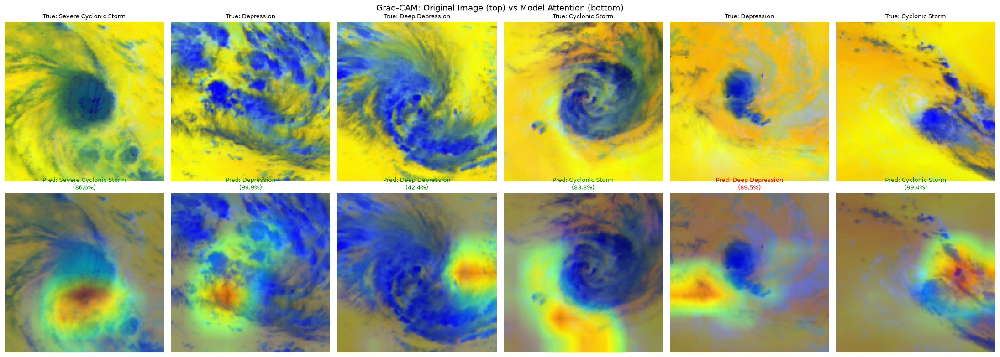

In [10]:
np.random.seed(42)
sample_indices = np.random.choice(val_idx, size=6, replace=False)

fig, axes = plt.subplots(2, 6, figsize=(22, 8))

for i, idx in enumerate(sample_indices):
    img_model, img_display = load_and_preprocess_image(h5_path, idx)
    heatmap, pred_class, pred_probs = make_gradcam_heatmap(img_model)
    overlay = overlay_heatmap(img_display, heatmap)

    true_class = encoded_labels[idx]
    true_name = int_to_category[str(true_class)]
    pred_name = int_to_category[str(pred_class)]
    confidence = pred_probs[pred_class] * 100

    axes[0, i].imshow(img_display)
    axes[0, i].set_title(f"True: {true_name}", fontsize=9)
    axes[0, i].axis('off')

    axes[1, i].imshow(overlay)
    color = "green" if pred_class == true_class else "red"
    axes[1, i].set_title(f"Pred: {pred_name}\n({confidence:.1f}%)", fontsize=9, color=color)
    axes[1, i].axis('off')

plt.suptitle("Grad-CAM: Original Image (top) vs Model Attention (bottom)", fontsize=13)
plt.tight_layout()
plt.show()

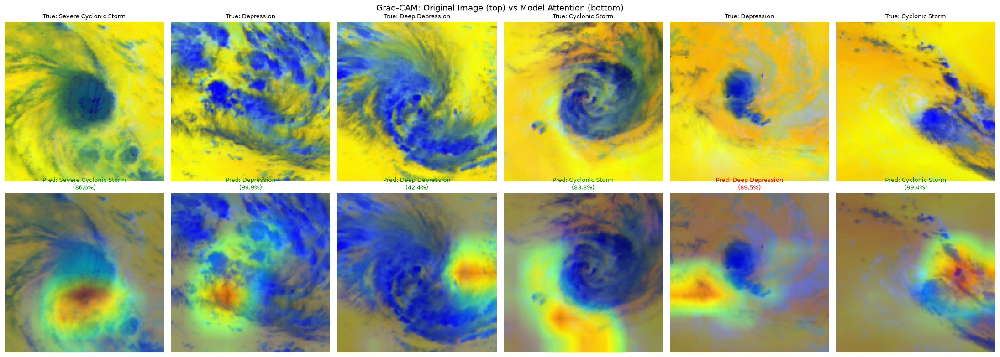

In [11]:
np.random.seed(42)
sample_indices = np.random.choice(val_idx, size=6, replace=False)

fig, axes = plt.subplots(2, 6, figsize=(22, 8))

for i, idx in enumerate(sample_indices):
    img_model, img_display = load_and_preprocess_image(h5_path, idx)
    heatmap, pred_class, pred_probs = make_gradcam_heatmap(img_model)
    overlay = overlay_heatmap(img_display, heatmap)

    true_class = encoded_labels[idx]
    true_name = int_to_category[str(true_class)]
    pred_name = int_to_category[str(pred_class)]
    confidence = pred_probs[pred_class] * 100

    axes[0, i].imshow(img_display)
    axes[0, i].set_title(f"True: {true_name}", fontsize=9)
    axes[0, i].axis('off')

    axes[1, i].imshow(overlay)
    color = "green" if pred_class == true_class else "red"
    axes[1, i].set_title(f"Pred: {pred_name}\n({confidence:.1f}%)", fontsize=9, color=color)
    axes[1, i].axis('off')

plt.suptitle("Grad-CAM: Original Image (top) vs Model Attention (bottom)", fontsize=13)
plt.tight_layout()
plt.savefig("../outputs/gradcam_sample_results.png", dpi=150, bbox_inches='tight')
plt.show()

In [12]:
num_classes = len(int_to_category)

# Har class se ek-ek sahi-predict image dhoondo
representative_indices = {}

for idx in val_idx:
    true_class = encoded_labels[idx]
    if true_class not in representative_indices:
        img_model, img_display = load_and_preprocess_image(h5_path, idx)
        heatmap, pred_class, pred_probs = make_gradcam_heatmap(img_model)
        if pred_class == true_class and pred_probs[pred_class] > 0.7:
            representative_indices[true_class] = idx
    if len(representative_indices) == num_classes:
        break

print("Found representative examples for classes:", sorted(representative_indices.keys()))

Found representative examples for classes: [0, 1, 2, 3, 4, 5]


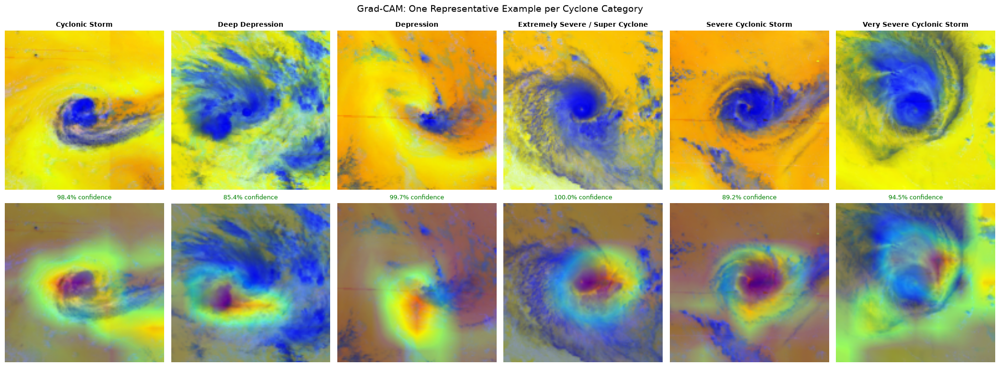

In [13]:
sorted_classes = sorted(representative_indices.keys())
n = len(sorted_classes)

fig, axes = plt.subplots(2, n, figsize=(3.5*n, 8))

for i, cls in enumerate(sorted_classes):
    idx = representative_indices[cls]
    img_model, img_display = load_and_preprocess_image(h5_path, idx)
    heatmap, pred_class, pred_probs = make_gradcam_heatmap(img_model)
    overlay = overlay_heatmap(img_display, heatmap)

    class_name = int_to_category[str(cls)]
    confidence = pred_probs[pred_class] * 100

    axes[0, i].imshow(img_display)
    axes[0, i].set_title(class_name, fontsize=10, fontweight='bold')
    axes[0, i].axis('off')

    axes[1, i].imshow(overlay)
    axes[1, i].set_title(f"{confidence:.1f}% confidence", fontsize=9, color='green')
    axes[1, i].axis('off')

plt.suptitle("Grad-CAM: One Representative Example per Cyclone Category", fontsize=14)
plt.tight_layout()
plt.savefig("../outputs/gradcam_per_class.png", dpi=150, bbox_inches='tight')
plt.show()

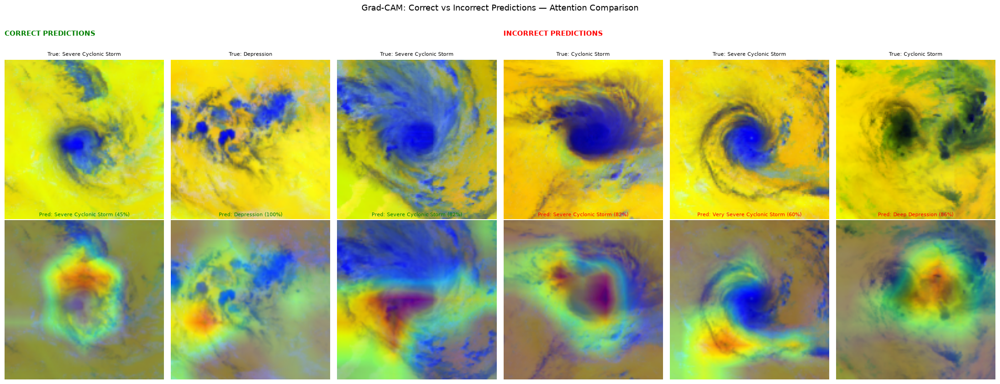

In [14]:
np.random.seed(7)
correct_idx = []
incorrect_idx = []

for idx in np.random.choice(val_idx, size=200, replace=False):
    img_model, img_display = load_and_preprocess_image(h5_path, idx)
    heatmap, pred_class, pred_probs = make_gradcam_heatmap(img_model)
    true_class = encoded_labels[idx]

    if pred_class == true_class and len(correct_idx) < 3:
        correct_idx.append(idx)
    elif pred_class != true_class and len(incorrect_idx) < 3:
        incorrect_idx.append(idx)

    if len(correct_idx) == 3 and len(incorrect_idx) == 3:
        break

fig, axes = plt.subplots(2, 6, figsize=(22, 8))

for col, idx in enumerate(correct_idx + incorrect_idx):
    img_model, img_display = load_and_preprocess_image(h5_path, idx)
    heatmap, pred_class, pred_probs = make_gradcam_heatmap(img_model)
    overlay = overlay_heatmap(img_display, heatmap)

    true_class = encoded_labels[idx]
    true_name = int_to_category[str(true_class)]
    pred_name = int_to_category[str(pred_class)]
    confidence = pred_probs[pred_class] * 100
    is_correct = pred_class == true_class

    axes[0, col].imshow(img_display)
    axes[0, col].set_title(f"True: {true_name}", fontsize=8)
    axes[0, col].axis('off')

    axes[1, col].imshow(overlay)
    color = "green" if is_correct else "red"
    axes[1, col].set_title(f"Pred: {pred_name} ({confidence:.0f}%)", fontsize=8, color=color)
    axes[1, col].axis('off')

axes[0, 0].annotate('CORRECT PREDICTIONS', xy=(0, 1.15), xycoords='axes fraction',
                     fontsize=11, fontweight='bold', color='green')
axes[0, 3].annotate('INCORRECT PREDICTIONS', xy=(0, 1.15), xycoords='axes fraction',
                     fontsize=11, fontweight='bold', color='red')

plt.suptitle("Grad-CAM: Correct vs Incorrect Predictions — Attention Comparison", fontsize=13, y=1.05)
plt.tight_layout()
plt.savefig("../outputs/gradcam_correct_vs_incorrect.png", dpi=150, bbox_inches='tight')
plt.show()

In [15]:
plt.savefig("../outputs/gradcam_visualizations/gradcam_grid.png", dpi=150, bbox_inches='tight')

<Figure size 640x480 with 0 Axes>